In [80]:
import geopandas as gpd
import pandas as pd
import numpy as np
import scipy
import libpysal
import momepy
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

In [39]:
chunks = gpd.read_parquet('../../urbangrammar_samba/spatial_signatures/local_auth_chunks.pq')

In [40]:
from shapely.geometry import Point

glasgow = gpd.GeoSeries([Point(-4.27, 55.83)], crs=4326).to_crs(27700)

In [41]:
chunks[chunks.intersects(glasgow[0])]

,geometry,chunkID
lbls,,
68.0,"POLYGON ((258955.030 656912.605, 258946.637 65...",68


In [48]:
gdf = gpd.read_parquet("../../urbangrammar_samba/spatial_signatures/tessellation/tess_68.pq")

In [45]:
data = pd.read_parquet("../../urbangrammar_samba/spatial_signatures/morphometrics/cells/cells_68.pq", columns=["hindex", "stbOri", "stcOri"])

In [49]:
gdf

,hindex,tessellation,buildings
0,c068e577346t0002,"MULTIPOLYGON Z (((256782.415 646457.307 0.000,...","POLYGON ((256717.210 646474.040, 256714.370 64..."
1,c068e577346t0000,"POLYGON Z ((255624.146 645761.736 0.000, 25650...","POLYGON ((256769.200 646379.070, 256787.930 64..."
2,c068e577346t0001,"POLYGON Z ((256905.432 646533.038 0.000, 25688...","POLYGON ((256863.140 646723.810, 256854.900 64..."
3,c068e526845t0000,"POLYGON ((257438.174 648051.856, 257469.010 64...","POLYGON ((257490.140 647931.190, 257497.380 64..."
4,c068e526845t0001,"POLYGON ((257514.148 647924.784, 257513.854 64...","POLYGON ((257514.540 647956.240, 257504.690 64..."
...,...,...,...
155604,c068e526038t0000,"POLYGON ((241781.030 686446.750, 241761.320 68...","POLYGON ((241766.950 686484.410, 241777.520 68..."
155605,c068e032023t0000,"POLYGON ((242486.000 687123.000, 242477.500 68...",None
155606,c068e032017t0000,"POLYGON ((242777.030 687232.830, 242768.070 68...",None
155607,c068e032018t0000,"POLYGON ((242761.310 687311.400, 242792.610 68...",None


In [50]:
gdf = gdf.merge(data, on='hindex')

In [51]:
centr = gpd.GeoDataFrame(gdf, geometry=gdf.tessellation.centroid)
%time W = momepy.sw_high(k=10, weights=libpysal.weights.Queen.from_dataframe(gdf, geom_col='tessellation'))

/opt/conda/lib/python3.8/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 27 disconnected components.
 There are 13 islands with ids: 152026, 152062, 154264, 154294, 154833, 154874, 154880, 155088, 155160, 155238, 155286, 155322, 155434.
  warnings.warn(message)


CPU times: user 5min 29s, sys: 12.4 s, total: 5min 42s
Wall time: 5min 41s


In [53]:
def gaussian(x, norm=100):
    c = (np.pi * 2) ** (-0.5)
    zs = x / norm
    return c * np.exp(-(zs ** 2) / 2.0)

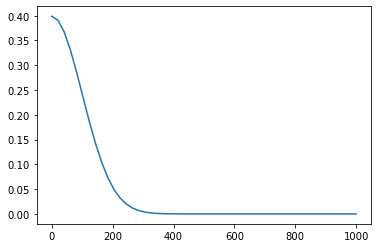

In [81]:
vals = np.linspace(0, 1000)
plt.plot(vals, gaussian(vals))

In [77]:
data = gdf

decay = []
k_gauss = []
k_200 = []
k_500 = []
k_50 =[]

for i, geom in tqdm(centr.geometry.iteritems(), total=data.shape[0]):
    neighbours = W.neighbors[i]
    vicinity = centr.iloc[neighbours]
    distance = vicinity.distance(geom)
    distance_decay = 1 / distance
    
#     kernel = gaussian(distance)
#     kernel_200 = gaussian(distance, 200)
#     kernel_500 = gaussian(distance, 500)
#     kernel_50 = gaussian(distance, 50)
    
    values = vicinity["stbOri"].values
    sorter = np.argsort(values)
    values = values[sorter]
    nan_mask = np.isnan(values)
    if nan_mask.all():
        decay.append(np.array([np.nan] * 3))
#         k_gauss.append(np.array([np.nan] * 3))
#         k_200.append(np.array([np.nan] * 3))
#         k_500.append(np.array([np.nan] * 3))
#         k_50.append(np.array([np.nan] * 3))
    else:
        sample_weight = distance_decay.values[sorter][~nan_mask]
        weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
        weighted_quantiles /= np.sum(sample_weight)
        interpolate = np.interp([.25, .5, .75], weighted_quantiles, values[~nan_mask])
        decay.append(interpolate)
        
#         sample_weight = kernel.values[sorter][~nan_mask]
#         weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
#         weighted_quantiles /= np.sum(sample_weight)
#         interpolate = np.interp([.25, .5, .75], weighted_quantiles, values[~nan_mask])
#         k_gauss.append(interpolate)
        
#         sample_weight = kernel_200.values[sorter][~nan_mask]
#         weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
#         weighted_quantiles /= np.sum(sample_weight)
#         interpolate = np.interp([.25, .5, .75], weighted_quantiles, values[~nan_mask])
#         k_200.append(interpolate)
        
#         sample_weight = kernel_500.values[sorter][~nan_mask]
#         weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
#         weighted_quantiles /= np.sum(sample_weight)
#         interpolate = np.interp([.25, .5, .75], weighted_quantiles, values[~nan_mask])
#         k_500.append(interpolate)
        
#         sample_weight = kernel_50.values[sorter][~nan_mask]
#         weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
#         weighted_quantiles /= np.sum(sample_weight)
#         interpolate = np.interp([.25, .5, .75], weighted_quantiles, values[~nan_mask])
#         k_50.append(interpolate)

  0%|          | 0/155609 [00:00<?, ?it/s]

<AxesSubplot:>

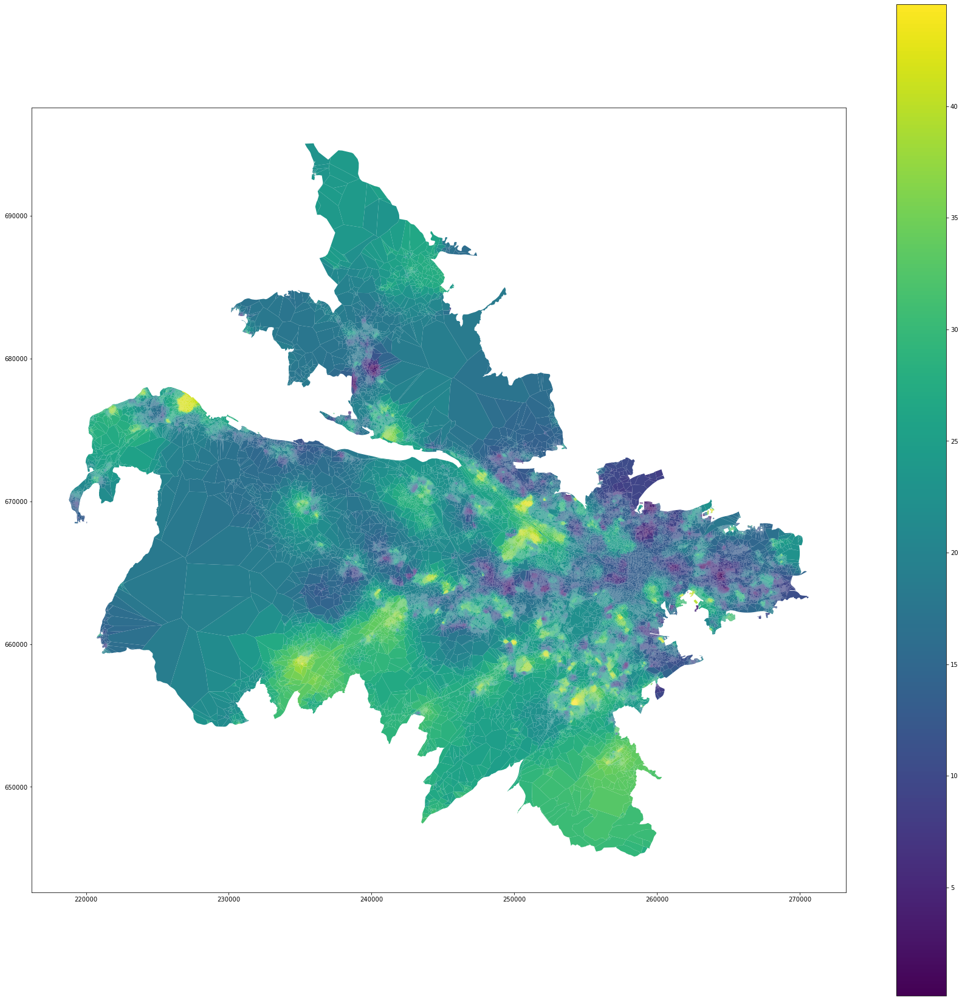

In [79]:
decay = pd.DataFrame(decay, index=data.index)
gdf.plot(decay[1], legend=True, figsize=(30, 30))

<AxesSubplot:>

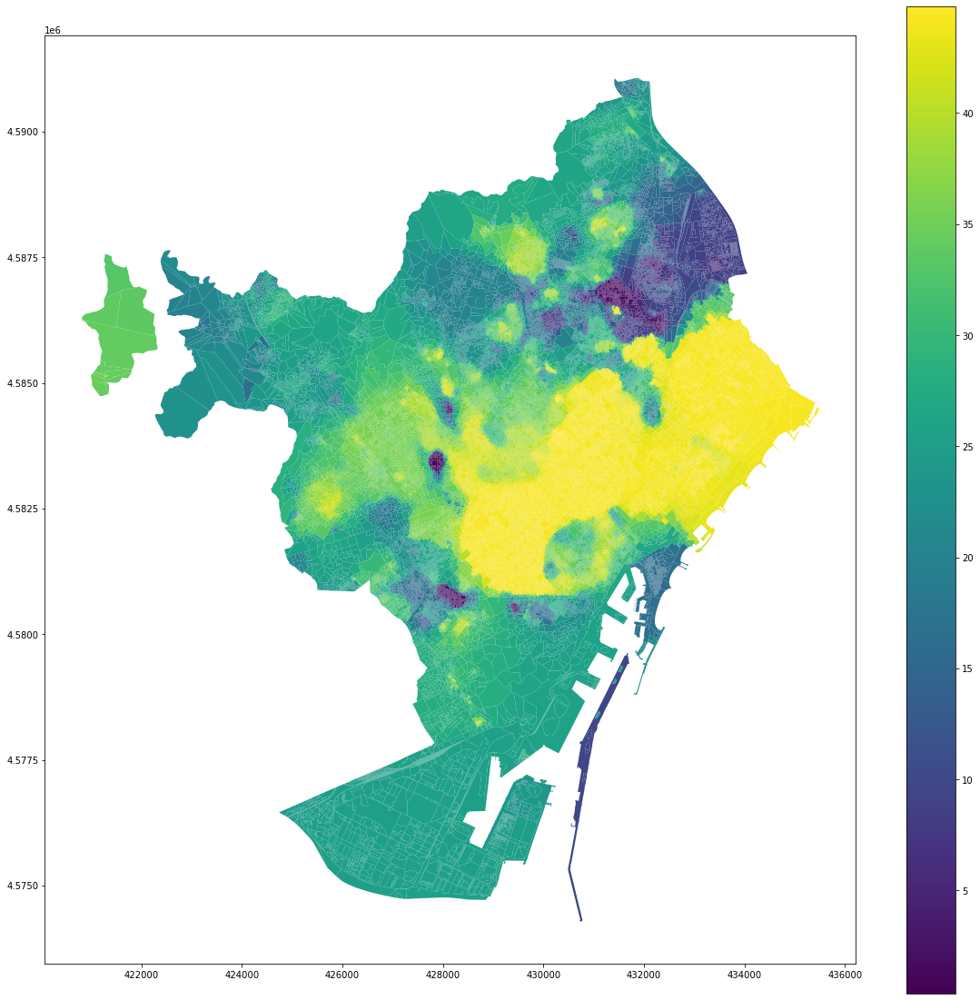

In [24]:
gdf.plot(decay[1], legend=True, figsize=(20, 20))

<AxesSubplot:>

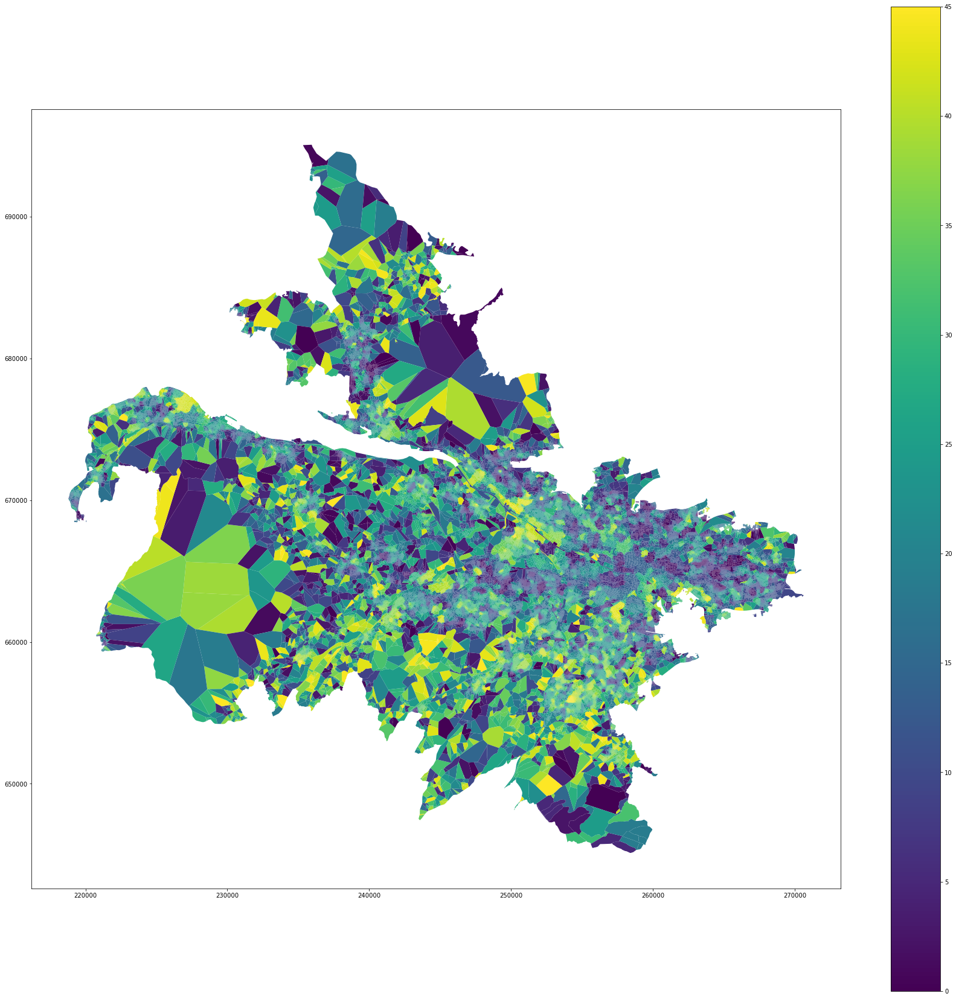

In [68]:
k_gauss = pd.DataFrame(k_gauss, index=data.index)
gdf.plot(k_gauss[1], legend=True, figsize=(30, 30))

<AxesSubplot:>

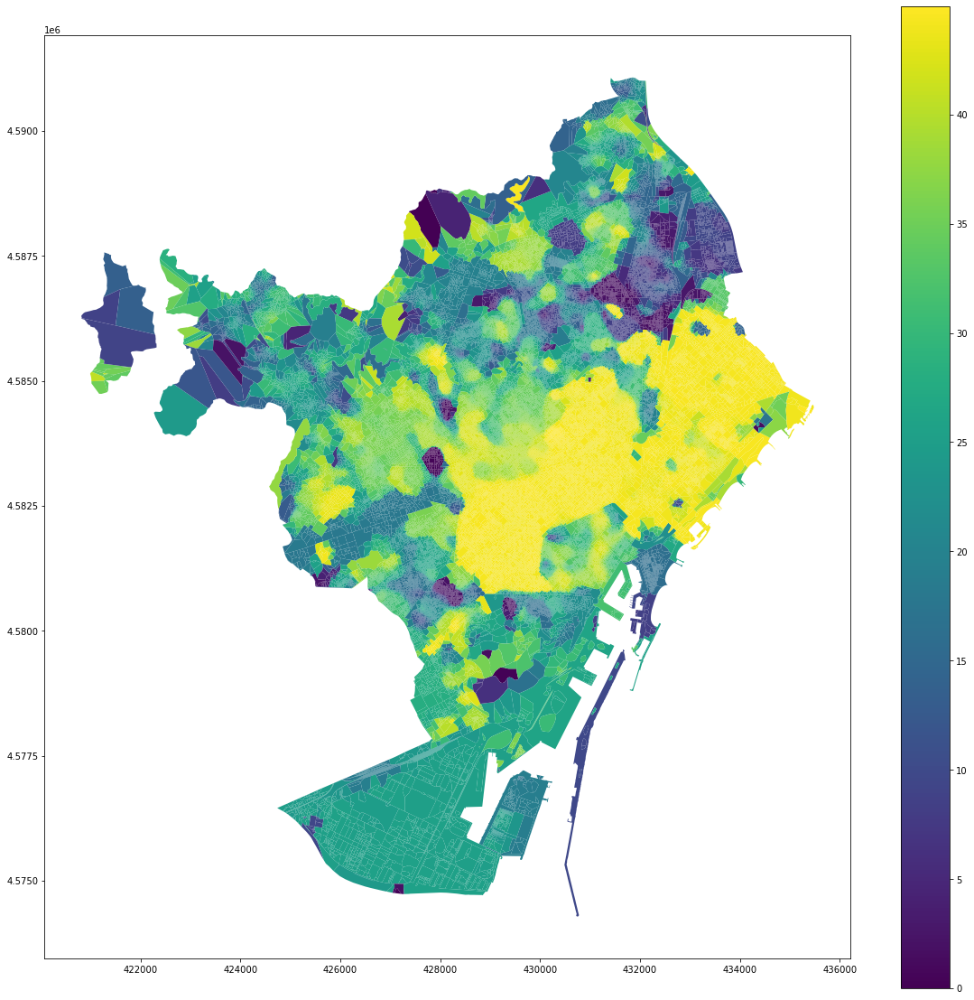

In [25]:
k_gauss = pd.DataFrame(k_gauss, index=data.index)
gdf.plot(k_gauss[1], legend=True, figsize=(20, 20))

<AxesSubplot:>

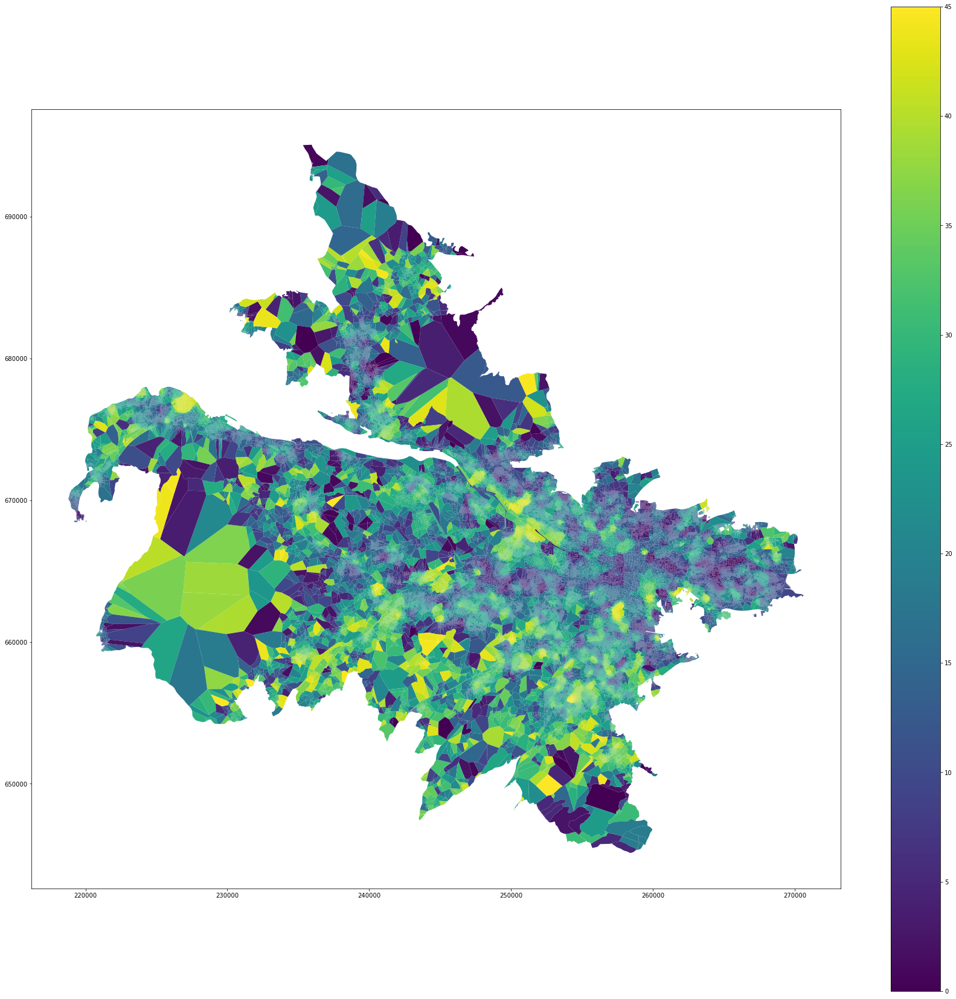

In [69]:
k_200 = pd.DataFrame(k_200, index=data.index)
gdf.plot(k_200[1], legend=True, figsize=(30, 30))

<AxesSubplot:>

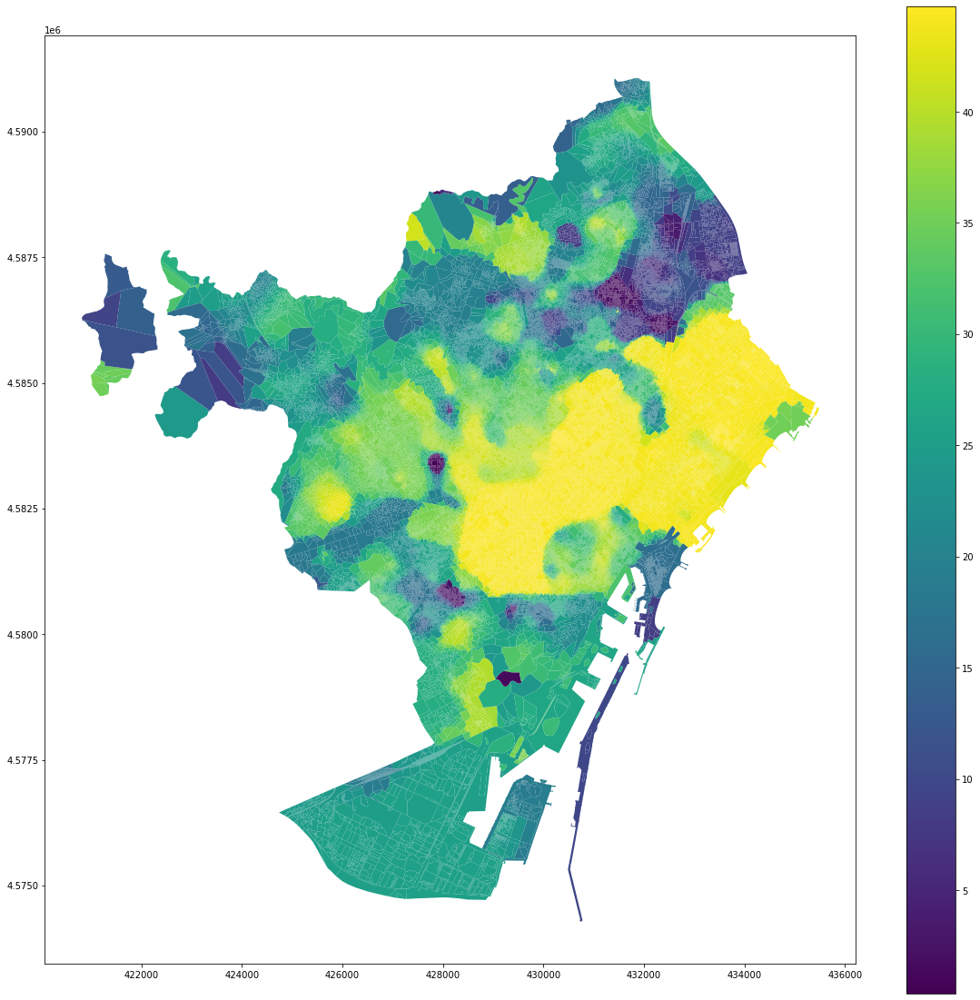

In [26]:
k_200 = pd.DataFrame(k_200, index=data.index)
gdf.plot(k_200[1], legend=True, figsize=(20, 20))

<AxesSubplot:>

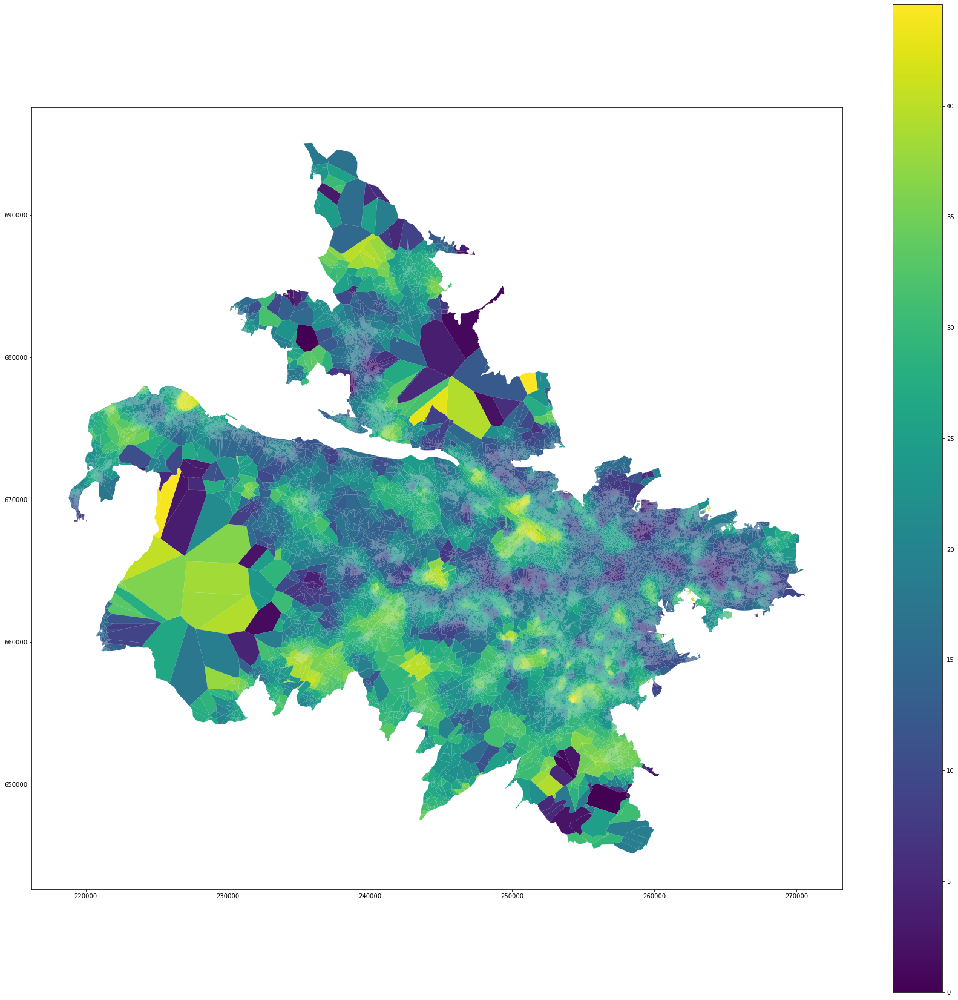

In [70]:
k_500 = pd.DataFrame(k_500, index=data.index)
gdf.plot(k_500[1], legend=True, figsize=(30, 30))

<AxesSubplot:>

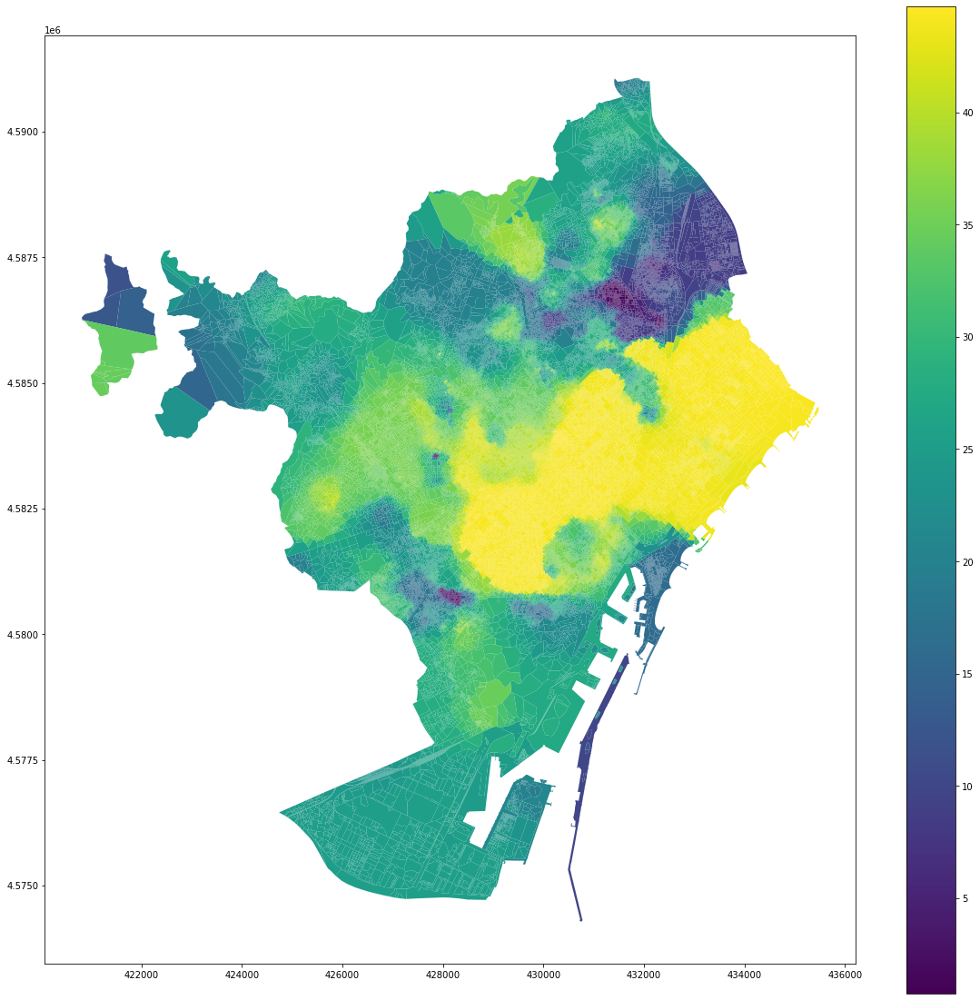

In [27]:
k_500 = pd.DataFrame(k_500, index=data.index)
gdf.plot(k_500[1], legend=True, figsize=(20, 20))

<AxesSubplot:>

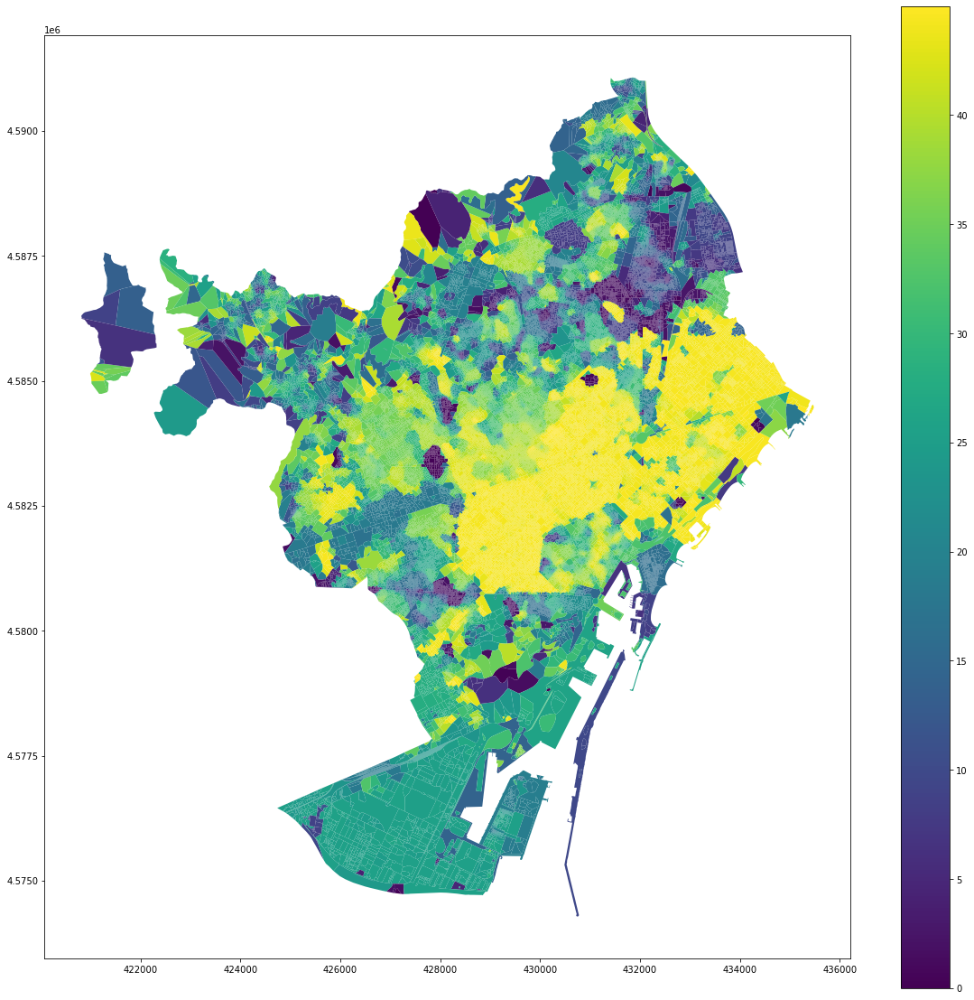

In [28]:
k_50 = pd.DataFrame(k_50, index=data.index)
gdf.plot(k_50[1], legend=True, figsize=(20, 20))

In [62]:
data

,hindex,tessellation,buildings,stbOri,stcOri,geometry
0,c068e577346t0002,"MULTIPOLYGON Z (((256782.415 646457.307 0.000,...","POLYGON ((256717.210 646474.040, 256714.370 64...",30.611388,1.759669,POINT (255631.771 646222.608)
1,c068e577346t0000,"POLYGON Z ((255624.146 645761.736 0.000, 25650...","POLYGON ((256769.200 646379.070, 256787.930 64...",5.092415,13.337640,POINT (256758.154 646029.196)
2,c068e577346t0001,"POLYGON Z ((256905.432 646533.038 0.000, 25688...","POLYGON ((256863.140 646723.810, 256854.900 64...",18.643296,8.958339,POINT (258002.595 646973.577)
3,c068e526845t0000,"POLYGON ((257438.174 648051.856, 257469.010 64...","POLYGON ((257490.140 647931.190, 257497.380 64...",44.114866,34.322206,POINT (257447.277 647949.602)
4,c068e526845t0001,"POLYGON ((257514.148 647924.784, 257513.854 64...","POLYGON ((257514.540 647956.240, 257504.690 64...",41.058015,43.656199,POINT (257577.167 648086.097)
...,...,...,...,...,...,...
155604,c068e526038t0000,"POLYGON ((241781.030 686446.750, 241761.320 68...","POLYGON ((241766.950 686484.410, 241777.520 68...",21.670448,20.780939,POINT (241776.435 686473.102)
155605,c068e032023t0000,"POLYGON ((242486.000 687123.000, 242477.500 68...",None,NaN,40.236358,POINT (242478.333 687131.333)
155606,c068e032017t0000,"POLYGON ((242777.030 687232.830, 242768.070 68...",None,NaN,32.503126,POINT (242764.674 687246.077)
155607,c068e032018t0000,"POLYGON ((242761.310 687311.400, 242792.610 68...",None,NaN,44.467063,POINT (242768.475 687279.405)


In [71]:
data = gdf.set_geometry("tessellation")

# pdecay = []
pk_gauss = []
pk_200 = []
pk_500 = []
pk_50 =[]

for i, geom in tqdm(data.geometry.iteritems(), total=data.shape[0]):
    neighbours = W.neighbors[i]
    vicinity = data.iloc[neighbours + [i]]
    distance = vicinity.distance(geom)
#     distance_decay = 1 / distance
    
    kernel = gaussian(distance)
    kernel_200 = gaussian(distance, 200)
    kernel_500 = gaussian(distance, 500)
    kernel_50 = gaussian(distance, 50)
    
    values = vicinity["stbOri"].values
    sorter = np.argsort(values)
    values = values[sorter]
    nan_mask = np.isnan(values)
    if nan_mask.all():
#         pdecay.append(np.array([np.nan] * 3))
        pk_gauss.append(np.array([np.nan] * 3))
        pk_200.append(np.array([np.nan] * 3))
        pk_500.append(np.array([np.nan] * 3))
        pk_50.append(np.array([np.nan] * 3))
    else:
#         sample_weight = distance_decay.values[sorter][~nan_mask]
#         weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
#         weighted_quantiles /= np.sum(sample_weight)
#         interpolate = np.interp([.25, .5, .75], weighted_quantiles, values[~nan_mask])
#         pdecay.append(interpolate)
        
        sample_weight = kernel.values[sorter][~nan_mask]
        weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
        weighted_quantiles /= np.sum(sample_weight)
        interpolate = np.interp([.25, .5, .75], weighted_quantiles, values[~nan_mask])
        pk_gauss.append(interpolate)
        
        sample_weight = kernel_200.values[sorter][~nan_mask]
        weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
        weighted_quantiles /= np.sum(sample_weight)
        interpolate = np.interp([.25, .5, .75], weighted_quantiles, values[~nan_mask])
        pk_200.append(interpolate)
        
        sample_weight = kernel_500.values[sorter][~nan_mask]
        weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
        weighted_quantiles /= np.sum(sample_weight)
        interpolate = np.interp([.25, .5, .75], weighted_quantiles, values[~nan_mask])
        pk_500.append(interpolate)
        
        sample_weight = kernel_50.values[sorter][~nan_mask]
        weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
        weighted_quantiles /= np.sum(sample_weight)
        interpolate = np.interp([.25, .5, .75], weighted_quantiles, values[~nan_mask])
        pk_50.append(interpolate)

  0%|          | 0/155609 [00:00<?, ?it/s]

<AxesSubplot:>

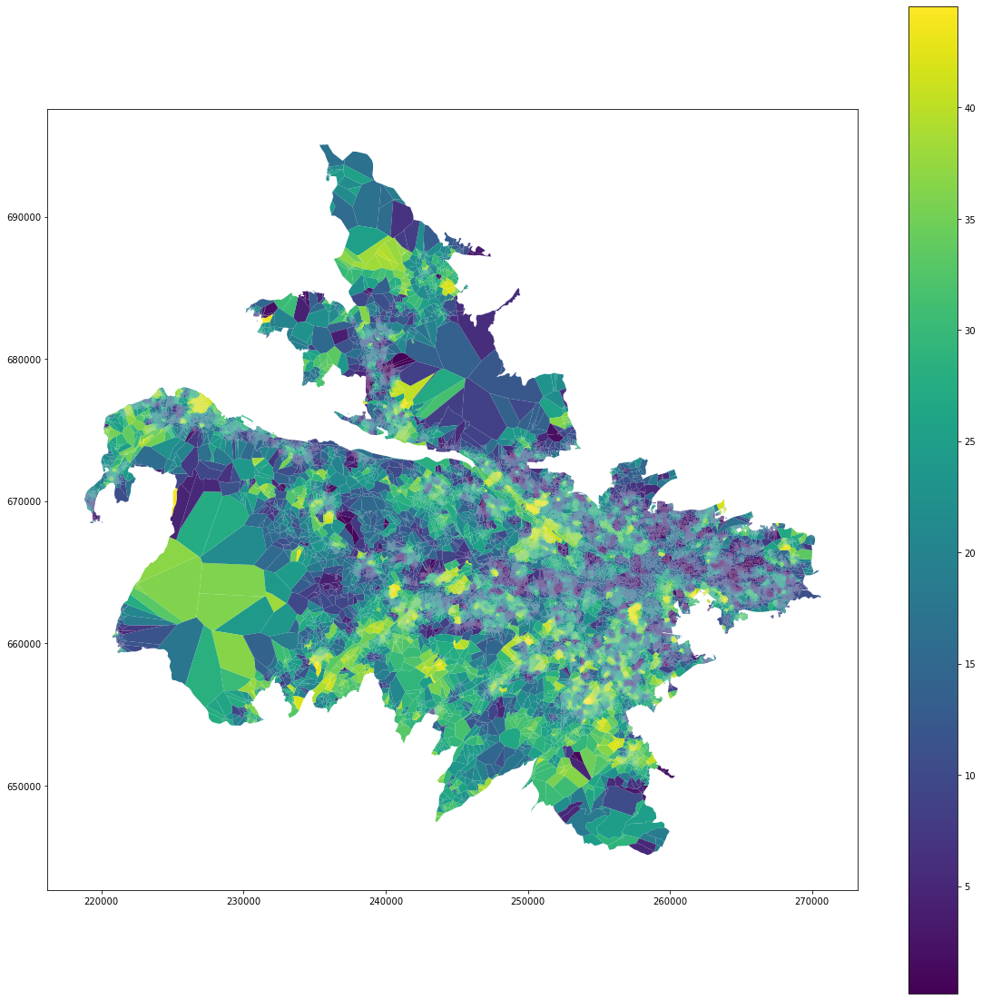

In [73]:
pk_gauss = pd.DataFrame(pk_gauss, index=data.index)
gdf.plot(pk_gauss[1], legend=True, figsize=(20, 20))

<AxesSubplot:>

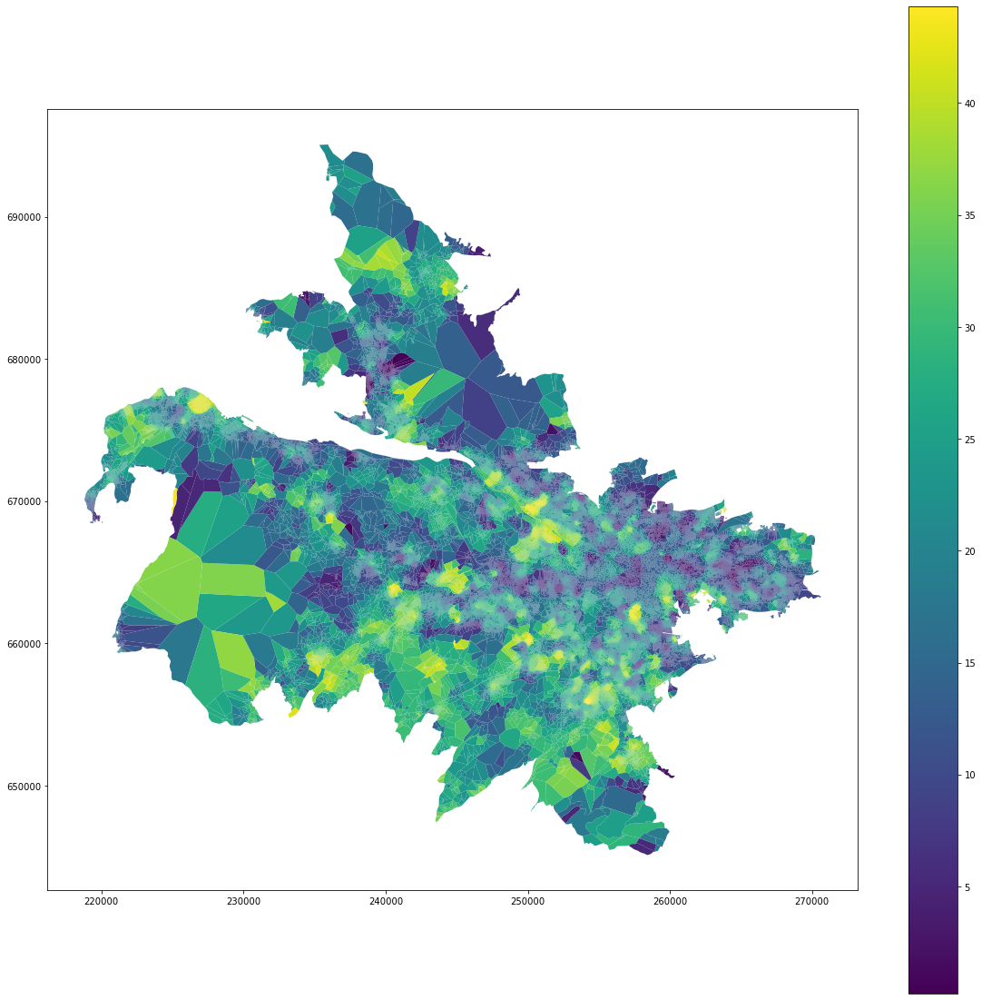

In [74]:
pk_200 = pd.DataFrame(pk_200, index=data.index)
gdf.plot(pk_200[1], legend=True, figsize=(20, 20))

<AxesSubplot:>

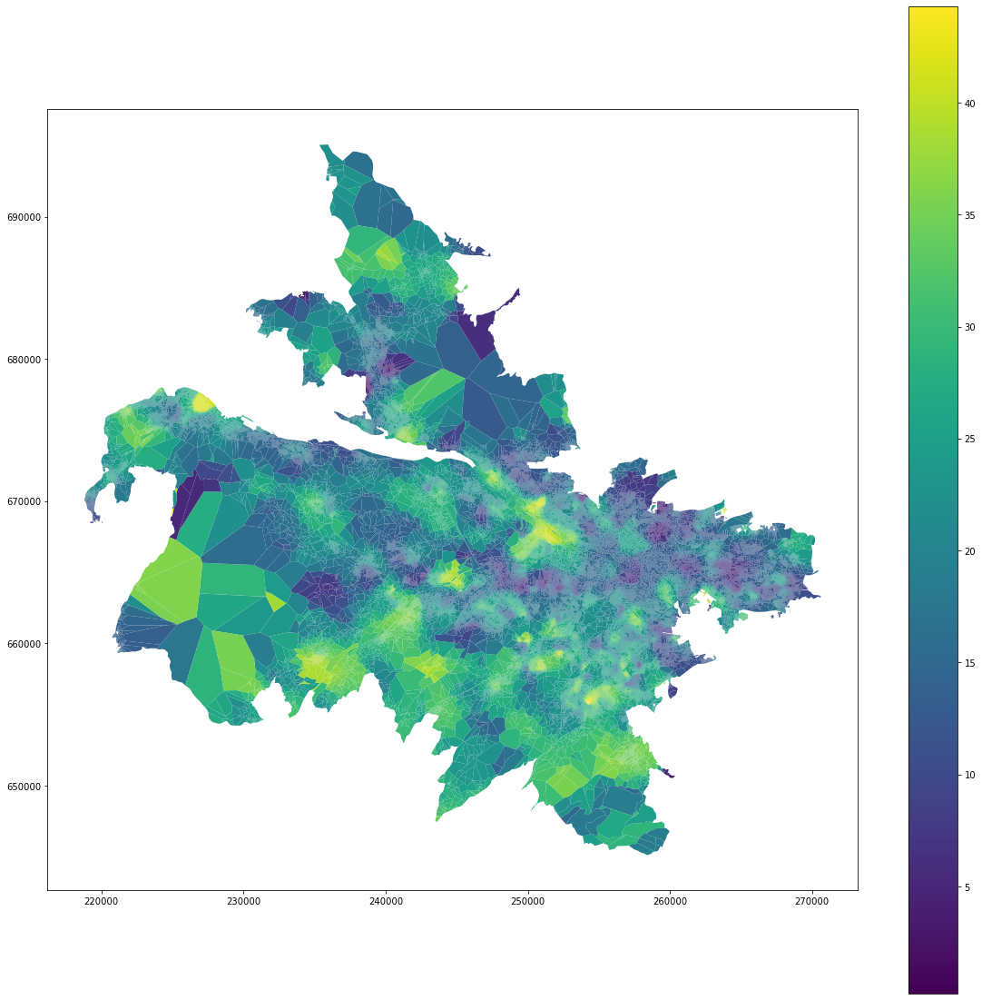

In [75]:
pk_500 = pd.DataFrame(pk_500, index=data.index)
gdf.plot(pk_500[1], legend=True, figsize=(20, 20))

<AxesSubplot:>

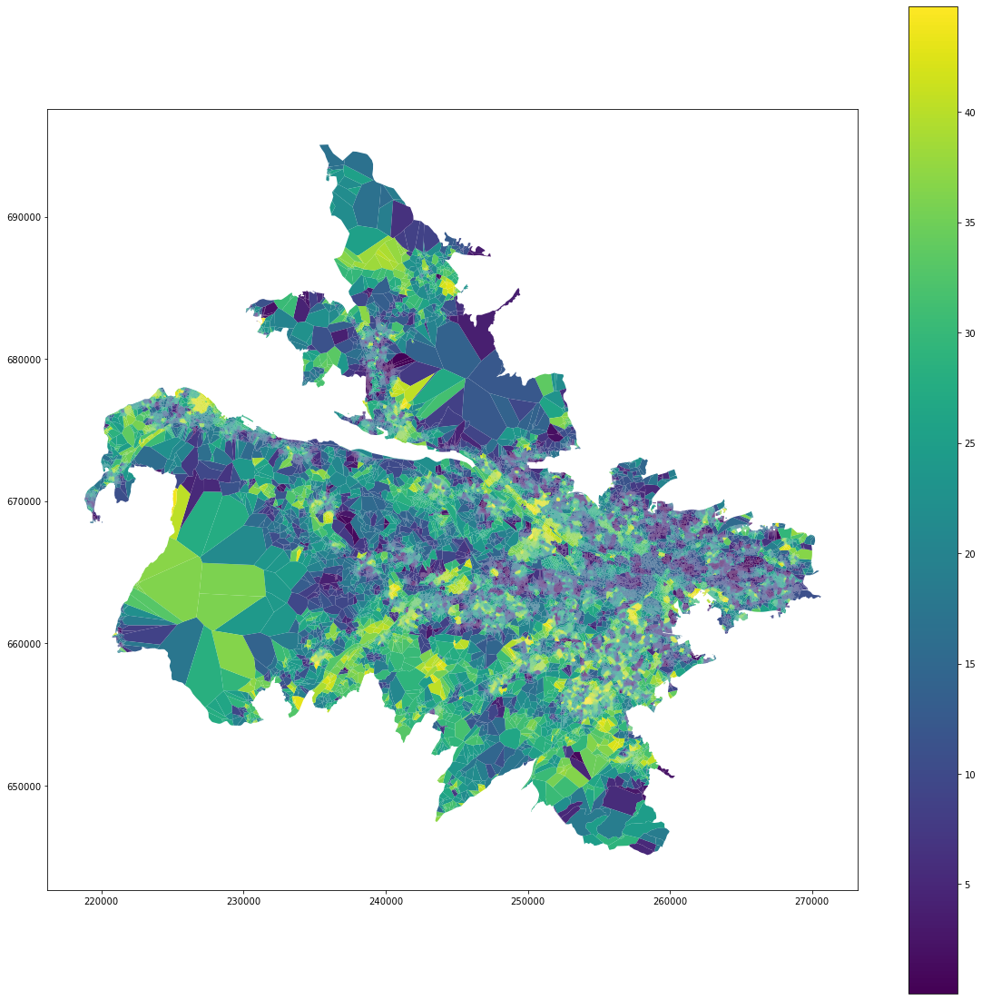

In [76]:
pk_50 = pd.DataFrame(pk_50, index=data.index)
gdf.plot(pk_50[1], legend=True, figsize=(20, 20))

<AxesSubplot:>

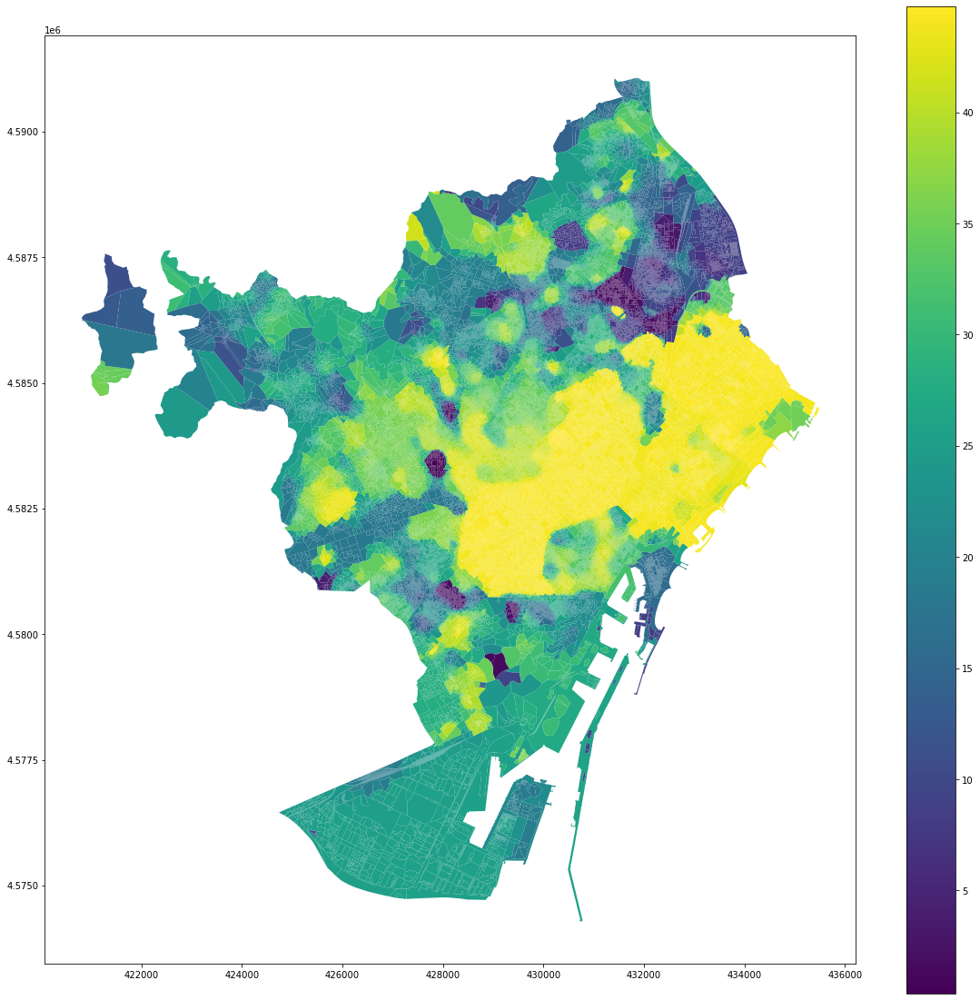

In [35]:
pk_gauss = pd.DataFrame(pk_gauss, index=data.index)
gdf.plot(pk_gauss[1], legend=True, figsize=(20, 20))

<AxesSubplot:>

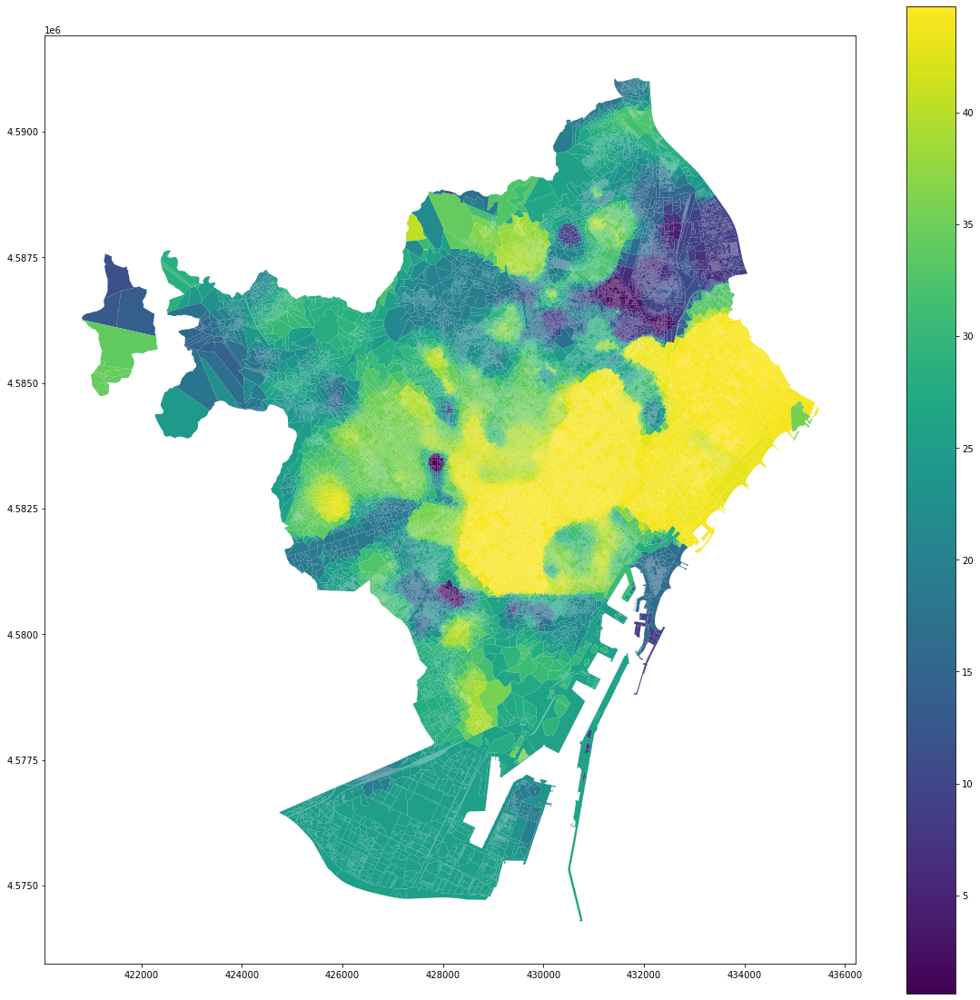

In [36]:
pk_200 = pd.DataFrame(pk_200, index=data.index)
gdf.plot(pk_200[1], legend=True, figsize=(20, 20))

<AxesSubplot:>

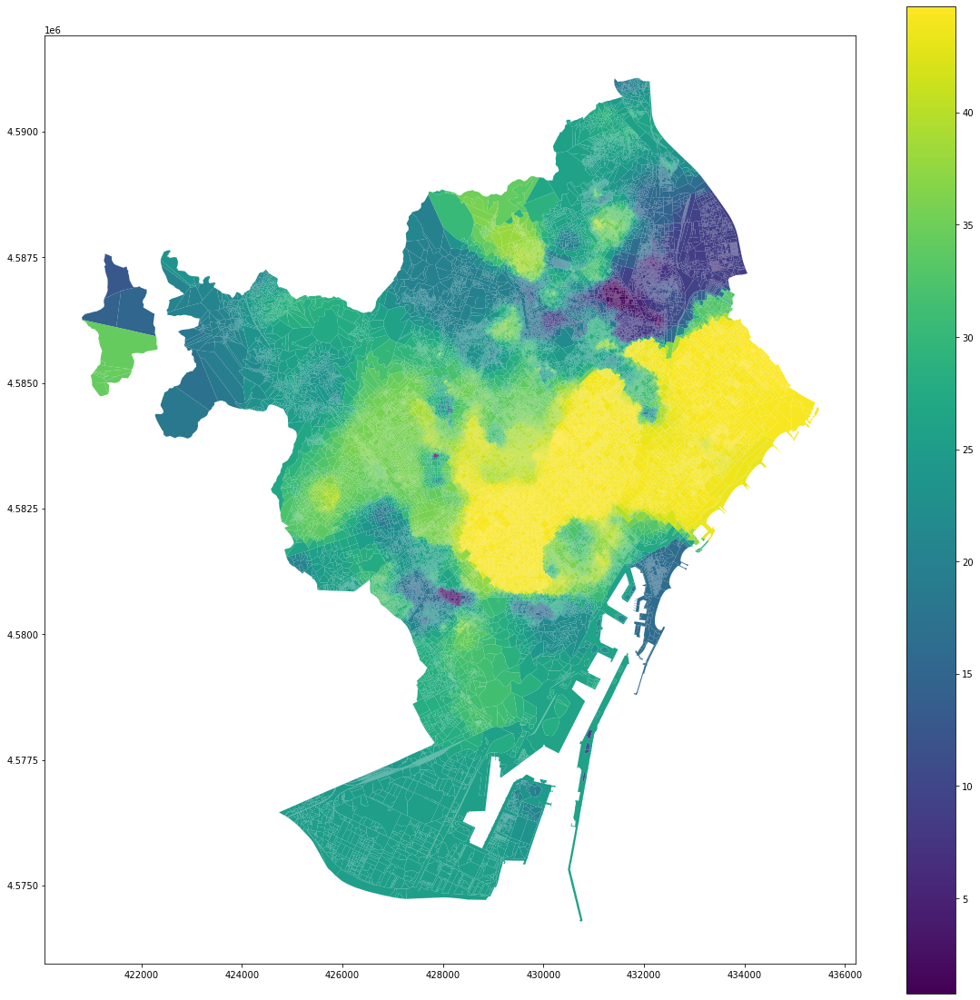

In [37]:
pk_500 = pd.DataFrame(pk_500, index=data.index)
gdf.plot(pk_500[1], legend=True, figsize=(20, 20))

<AxesSubplot:>

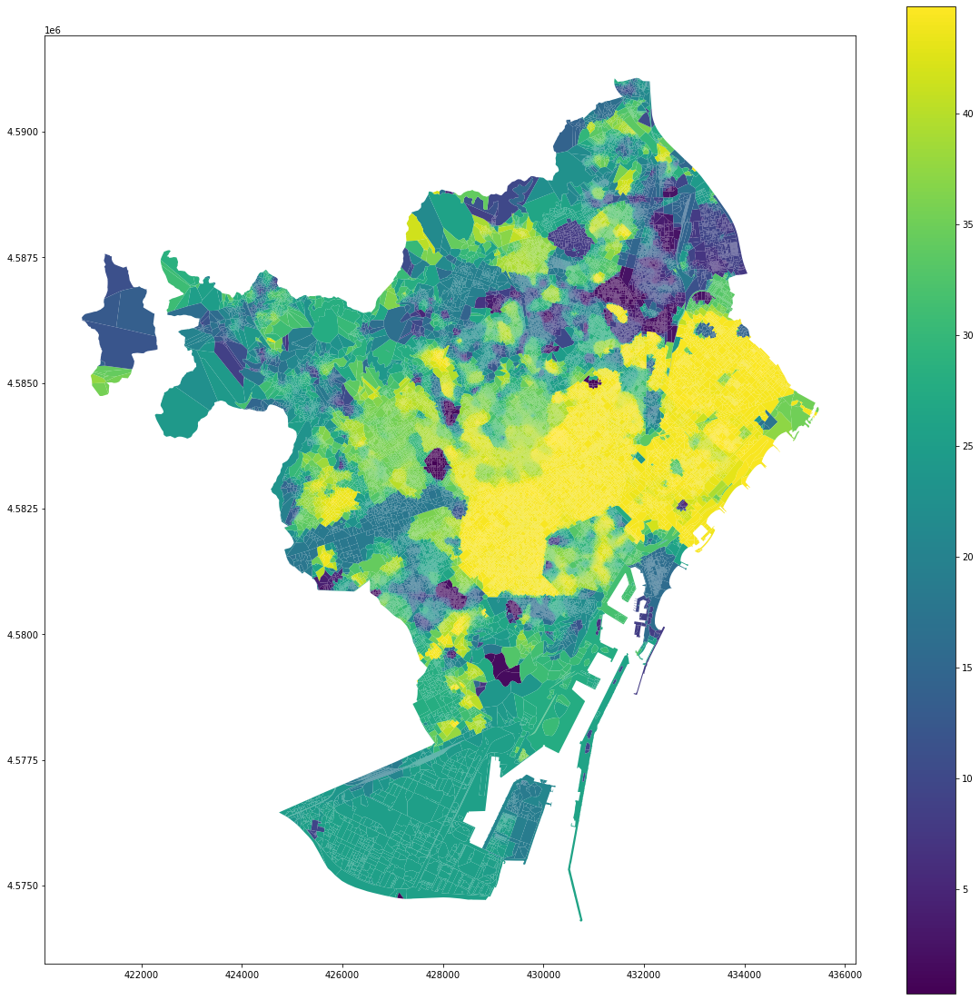

In [38]:
pk_50 = pd.DataFrame(pk_50, index=data.index)
gdf.plot(pk_50[1], legend=True, figsize=(20, 20))